In [1]:
import pandas as pd
import numpy as np
import re

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=DeprecationWarning)
warnings.simplefilter(action='ignore', category=RuntimeWarning)

from sklearn. preprocessing import StandardScaler
from sklearn.decomposition import PCA
import scipy.cluster.hierarchy as sch
from sklearn.cluster import KMeans 
from sklearn.metrics import silhouette_score

try:
    from kneed import KneeLocator
except:
    !pip install kneed
    from kneed import KneeLocator

# 2.1 Набор данных, анализ качества данных, предобработка данных, подготовка данных к моделированию

In [2]:
df = pd.read_csv("/kaggle/input/bank-customer-segmentation/bank_transactions.csv")

In [3]:
df

,TransactionID,CustomerID,CustomerDOB,CustGender,CustLocation,CustAccountBalance,TransactionDate,TransactionTime,TransactionAmount (INR)
0,T1,C5841053,10/1/94,F,JAMSHEDPUR,17819.05,2/8/16,143207,25.0
1,T2,C2142763,4/4/57,M,JHAJJAR,2270.69,2/8/16,141858,27999.0
2,T3,C4417068,26/11/96,F,MUMBAI,17874.44,2/8/16,142712,459.0
3,T4,C5342380,14/9/73,F,MUMBAI,866503.21,2/8/16,142714,2060.0
4,T5,C9031234,24/3/88,F,NAVI MUMBAI,6714.43,2/8/16,181156,1762.5
...,...,...,...,...,...,...,...,...,...
1048562,T1048563,C8020229,8/4/90,M,NEW DELHI,7635.19,18/9/16,184824,799.0
1048563,T1048564,C6459278,20/2/92,M,NASHIK,27311.42,18/9/16,183734,460.0
1048564,T1048565,C6412354,18/5/89,M,HYDERABAD,221757.06,18/9/16,183313,770.0
1048565,T1048566,C6420483,30/8/78,M,VISAKHAPATNAM,10117.87,18/9/16,184706,1000.0


In [4]:
df.shape

(1048567, 9)

In [5]:
# оценка данных на 'чистоту'
def check(df):
    l=[]
    columns=df.columns
    for col in columns:
        dtypes=df[col].dtypes
        nunique=df[col].nunique()
        sum_null=df[col].isnull().sum()
        l.append([col,dtypes,nunique,sum_null])
    df_check=pd.DataFrame(l)
    df_check.columns=['column','dtypes','nunique','sum_null']
    return df_check 
check(df)

,column,dtypes,nunique,sum_null
0,TransactionID,object,1048567,0
1,CustomerID,object,884265,0
2,CustomerDOB,object,17254,3397
3,CustGender,object,3,1100
4,CustLocation,object,9355,151
5,CustAccountBalance,float64,161328,2369
6,TransactionDate,object,55,0
7,TransactionTime,int64,81918,0
8,TransactionAmount (INR),float64,93024,0


In [6]:
df.dropna(inplace=True)

In [7]:
df.shape

(1041614, 9)

In [8]:
df.duplicated().sum()

0

In [9]:
df['TransactionDate'] = pd.to_datetime(df['TransactionDate'])
df['CustomerDOB'] = pd.to_datetime(df['CustomerDOB'])

/tmp/ipykernel_18/3105320130.py:1: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['TransactionDate'] = pd.to_datetime(df['TransactionDate'])
/tmp/ipykernel_18/3105320130.py:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['CustomerDOB'] = pd.to_datetime(df['CustomerDOB'])


In [10]:
df

,TransactionID,CustomerID,CustomerDOB,CustGender,CustLocation,CustAccountBalance,TransactionDate,TransactionTime,TransactionAmount (INR)
0,T1,C5841053,1994-10-01,F,JAMSHEDPUR,17819.05,2016-02-08,143207,25.0
1,T2,C2142763,2057-04-04,M,JHAJJAR,2270.69,2016-02-08,141858,27999.0
2,T3,C4417068,1996-11-26,F,MUMBAI,17874.44,2016-02-08,142712,459.0
3,T4,C5342380,2073-09-14,F,MUMBAI,866503.21,2016-02-08,142714,2060.0
4,T5,C9031234,1988-03-24,F,NAVI MUMBAI,6714.43,2016-02-08,181156,1762.5
...,...,...,...,...,...,...,...,...,...
1048562,T1048563,C8020229,1990-08-04,M,NEW DELHI,7635.19,2016-09-18,184824,799.0
1048563,T1048564,C6459278,1992-02-20,M,NASHIK,27311.42,2016-09-18,183734,460.0
1048564,T1048565,C6412354,1989-05-18,M,HYDERABAD,221757.06,2016-09-18,183313,770.0
1048565,T1048566,C6420483,1978-08-30,M,VISAKHAPATNAM,10117.87,2016-09-18,184706,1000.0


In [11]:
df.dtypes

TransactionID                      object
CustomerID                         object
CustomerDOB                datetime64[ns]
CustGender                         object
CustLocation                       object
CustAccountBalance                float64
TransactionDate            datetime64[ns]
TransactionTime                     int64
TransactionAmount (INR)           float64
dtype: object

In [12]:
# расчет возраста клиентов для получения количественного параметра
df['CustomerAge'] =df['TransactionDate'].dt.year - df['CustomerDOB'].dt.year

In [13]:
df

,TransactionID,CustomerID,CustomerDOB,CustGender,CustLocation,CustAccountBalance,TransactionDate,TransactionTime,TransactionAmount (INR),CustomerAge
0,T1,C5841053,1994-10-01,F,JAMSHEDPUR,17819.05,2016-02-08,143207,25.0,22
1,T2,C2142763,2057-04-04,M,JHAJJAR,2270.69,2016-02-08,141858,27999.0,-41
2,T3,C4417068,1996-11-26,F,MUMBAI,17874.44,2016-02-08,142712,459.0,20
3,T4,C5342380,2073-09-14,F,MUMBAI,866503.21,2016-02-08,142714,2060.0,-57
4,T5,C9031234,1988-03-24,F,NAVI MUMBAI,6714.43,2016-02-08,181156,1762.5,28
...,...,...,...,...,...,...,...,...,...,...
1048562,T1048563,C8020229,1990-08-04,M,NEW DELHI,7635.19,2016-09-18,184824,799.0,26
1048563,T1048564,C6459278,1992-02-20,M,NASHIK,27311.42,2016-09-18,183734,460.0,24
1048564,T1048565,C6412354,1989-05-18,M,HYDERABAD,221757.06,2016-09-18,183313,770.0,27
1048565,T1048566,C6420483,1978-08-30,M,VISAKHAPATNAM,10117.87,2016-09-18,184706,1000.0,38


In [14]:
df.to_csv('bank_transactions2.csv', index=False)

In [15]:
df.shape

(1041614, 10)

In [16]:
df.drop(columns=['TransactionTime'],inplace=True)

In [17]:
df.CustGender.value_counts()

CustGender
M    760978
F    280635
T         1
Name: count, dtype: int64

In [18]:
df.drop(df[df['CustGender']=='T'].index,inplace=True)

In [19]:
num_col = df.select_dtypes(include=np.number)
cat_col = df.select_dtypes(exclude=np.number)

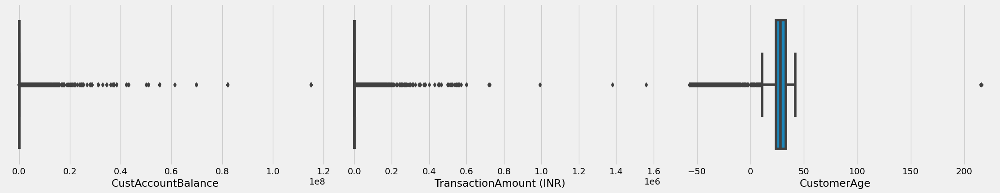

In [20]:
# оценка количественных признаков на адекватность
plt.style.use("fivethirtyeight")
plt.figure(figsize=(30,30))
for index,column in enumerate(num_col):
    plt.subplot(7,4,index+1)
    sns.boxplot(data=num_col,x=column)
    
plt.tight_layout(pad = 1.0)

In [21]:
df.shape

(1041613, 9)

In [22]:
# возникновение отрицательных возрастов
df.query("CustomerAge <= 0")

,TransactionID,CustomerID,CustomerDOB,CustGender,CustLocation,CustAccountBalance,TransactionDate,TransactionAmount (INR),CustomerAge
1,T2,C2142763,2057-04-04,M,JHAJJAR,2270.69,2016-02-08,27999.00,-41
3,T4,C5342380,2073-09-14,F,MUMBAI,866503.21,2016-02-08,2060.00,-57
5,T6,C1536588,2072-08-10,F,ITANAGAR,53609.20,2016-02-08,676.00,-56
15,T16,C8334633,2068-10-07,F,NEW DELHI,1283.12,2016-01-08,250.00,-52
30,T31,C7648712,2067-01-21,F,NEW DELHI,298461.05,2016-03-08,500.00,-51
...,...,...,...,...,...,...,...,...,...
1048506,T1048507,C3333984,2070-09-20,M,NAVI MUMBAI,41.82,2016-09-18,878.18,-54
1048510,T1048511,C3429427,2048-07-15,M,HOWRAH,416244.74,2016-09-18,1695.00,-32
1048536,T1048537,C2939947,2033-05-10,M,NEW DELHI,92173.35,2016-09-18,1319.04,-17
1048544,T1048545,C3712582,2071-05-10,M,MUMBAI,25414.52,2016-09-18,400.00,-55


In [23]:
# очистка от 'странных' данных - отрицательный и сегмент 1800-01-01
df = df[df["CustomerAge"] >= 0]
df = df[df["CustomerDOB"] != "1800-01-01"]

In [24]:
df.shape

(891440, 9)

In [25]:
df

,TransactionID,CustomerID,CustomerDOB,CustGender,CustLocation,CustAccountBalance,TransactionDate,TransactionAmount (INR),CustomerAge
0,T1,C5841053,1994-10-01,F,JAMSHEDPUR,17819.05,2016-02-08,25.0,22
2,T3,C4417068,1996-11-26,F,MUMBAI,17874.44,2016-02-08,459.0,20
4,T5,C9031234,1988-03-24,F,NAVI MUMBAI,6714.43,2016-02-08,1762.5,28
6,T7,C7126560,1992-01-26,F,MUMBAI,973.46,2016-02-08,566.0,24
7,T8,C1220223,1982-01-27,M,MUMBAI,95075.54,2016-02-08,148.0,34
...,...,...,...,...,...,...,...,...,...
1048562,T1048563,C8020229,1990-08-04,M,NEW DELHI,7635.19,2016-09-18,799.0,26
1048563,T1048564,C6459278,1992-02-20,M,NASHIK,27311.42,2016-09-18,460.0,24
1048564,T1048565,C6412354,1989-05-18,M,HYDERABAD,221757.06,2016-09-18,770.0,27
1048565,T1048566,C6420483,1978-08-30,M,VISAKHAPATNAM,10117.87,2016-09-18,1000.0,38


Для извлечения наибольшего числа количественных показателей из полученных данных, производится расчет показателей Recency (время прошедшее с последней транзакции) и Frequency (частотность заказов). В итоге получаем возможность заменить категориальные признаки количественными.

In [26]:
df['TransactionDate1']=df['TransactionDate'] #  первая транзакция
df['TransactionDate2']=df['TransactionDate'] # вторая транзакция
RFM_df = df.groupby("CustomerID").agg({
                                        "TransactionID" : "count",
                                        "CustGender" : "first",
                                        "CustLocation":"first",
                                        "CustAccountBalance"  : "mean",
                                        "TransactionAmount (INR)" : "mean",
                                        "CustomerAge" : "median",
                                        "TransactionDate2":"max",
                                        "TransactionDate1":"min",
                                        "TransactionDate":"median"
                        })

RFM_df = RFM_df.reset_index()
RFM_df.head()

,CustomerID,TransactionID,CustGender,CustLocation,CustAccountBalance,TransactionAmount (INR),CustomerAge,TransactionDate2,TransactionDate1,TransactionDate
0,C1010011,2,F,NOIDA,76340.635,2553.0,28.5,2016-09-26,2016-09-08,2016-09-17
1,C1010012,1,M,MUMBAI,24204.490,1499.0,22.0,2016-08-14,2016-08-14,2016-08-14
2,C1010014,2,F,MUMBAI,100112.950,727.5,28.0,2016-07-08,2016-01-08,2016-04-08
3,C1010018,1,F,CHAMPARAN,496.180,30.0,26.0,2016-09-15,2016-09-15,2016-09-15
4,C1010028,1,F,DELHI,296828.370,557.0,28.0,2016-08-29,2016-08-29,2016-08-29


In [27]:
RFM_df.shape

(770133, 10)

In [28]:
RFM_df.drop(columns=["CustomerID"],inplace=True)

In [29]:
RFM_df.rename(columns={"TransactionID":"Frequency"},inplace=True)

In [30]:
RFM_df['Recency']=RFM_df['TransactionDate2']-RFM_df['TransactionDate1']
RFM_df['Recency']=RFM_df['Recency'].astype(str)

In [31]:
RFM_df

,Frequency,CustGender,CustLocation,CustAccountBalance,TransactionAmount (INR),CustomerAge,TransactionDate2,TransactionDate1,TransactionDate,Recency
0,2,F,NOIDA,76340.635,2553.0,28.5,2016-09-26,2016-09-08,2016-09-17,18 days
1,1,M,MUMBAI,24204.490,1499.0,22.0,2016-08-14,2016-08-14,2016-08-14,0 days
2,2,F,MUMBAI,100112.950,727.5,28.0,2016-07-08,2016-01-08,2016-04-08,182 days
3,1,F,CHAMPARAN,496.180,30.0,26.0,2016-09-15,2016-09-15,2016-09-15,0 days
4,1,F,DELHI,296828.370,557.0,28.0,2016-08-29,2016-08-29,2016-08-29,0 days
...,...,...,...,...,...,...,...,...,...,...
770128,1,M,BHIWANDI,133067.230,691.0,26.0,2016-07-08,2016-07-08,2016-07-08,0 days
770129,1,M,BANGALORE,96063.460,222.0,20.0,2016-09-15,2016-09-15,2016-09-15,0 days
770130,1,M,GUNTUR,5559.750,126.0,23.0,2016-08-18,2016-08-18,2016-08-18,0 days
770131,1,M,CHENNAI,35295.920,50.0,21.0,2016-08-28,2016-08-28,2016-08-28,0 days


In [32]:
# убираем слово 'days'
RFM_df['Recency']=RFM_df['Recency'].apply(lambda x :re.search('\d+',x).group())
RFM_df['Recency']=RFM_df['Recency'].astype(int)

In [33]:
RFM_df

,Frequency,CustGender,CustLocation,CustAccountBalance,TransactionAmount (INR),CustomerAge,TransactionDate2,TransactionDate1,TransactionDate,Recency
0,2,F,NOIDA,76340.635,2553.0,28.5,2016-09-26,2016-09-08,2016-09-17,18
1,1,M,MUMBAI,24204.490,1499.0,22.0,2016-08-14,2016-08-14,2016-08-14,0
2,2,F,MUMBAI,100112.950,727.5,28.0,2016-07-08,2016-01-08,2016-04-08,182
3,1,F,CHAMPARAN,496.180,30.0,26.0,2016-09-15,2016-09-15,2016-09-15,0
4,1,F,DELHI,296828.370,557.0,28.0,2016-08-29,2016-08-29,2016-08-29,0
...,...,...,...,...,...,...,...,...,...,...
770128,1,M,BHIWANDI,133067.230,691.0,26.0,2016-07-08,2016-07-08,2016-07-08,0
770129,1,M,BANGALORE,96063.460,222.0,20.0,2016-09-15,2016-09-15,2016-09-15,0
770130,1,M,GUNTUR,5559.750,126.0,23.0,2016-08-18,2016-08-18,2016-08-18,0
770131,1,M,CHENNAI,35295.920,50.0,21.0,2016-08-28,2016-08-28,2016-08-28,0


In [34]:
# По логике вещей, 0 дней означают, что клиент недавно совершил транзакцию один раз, поэтому преобразовываем 0 в 1
def rep_0(i):
    if i==0:
        return 1
    else:
        return i
RFM_df['Recency']=RFM_df['Recency'].apply(rep_0)

In [35]:
RFM_df.drop(columns=["TransactionDate1","TransactionDate2"],inplace=True)

In [36]:
RFM_df

,Frequency,CustGender,CustLocation,CustAccountBalance,TransactionAmount (INR),CustomerAge,TransactionDate,Recency
0,2,F,NOIDA,76340.635,2553.0,28.5,2016-09-17,18
1,1,M,MUMBAI,24204.490,1499.0,22.0,2016-08-14,1
2,2,F,MUMBAI,100112.950,727.5,28.0,2016-04-08,182
3,1,F,CHAMPARAN,496.180,30.0,26.0,2016-09-15,1
4,1,F,DELHI,296828.370,557.0,28.0,2016-08-29,1
...,...,...,...,...,...,...,...,...
770128,1,M,BHIWANDI,133067.230,691.0,26.0,2016-07-08,1
770129,1,M,BANGALORE,96063.460,222.0,20.0,2016-09-15,1
770130,1,M,GUNTUR,5559.750,126.0,23.0,2016-08-18,1
770131,1,M,CHENNAI,35295.920,50.0,21.0,2016-08-28,1


In [37]:
RFM_df['Frequency']=RFM_df['Frequency'].astype(int)

In [38]:
RFM_df.to_csv("RFM_df.csv", index=False)

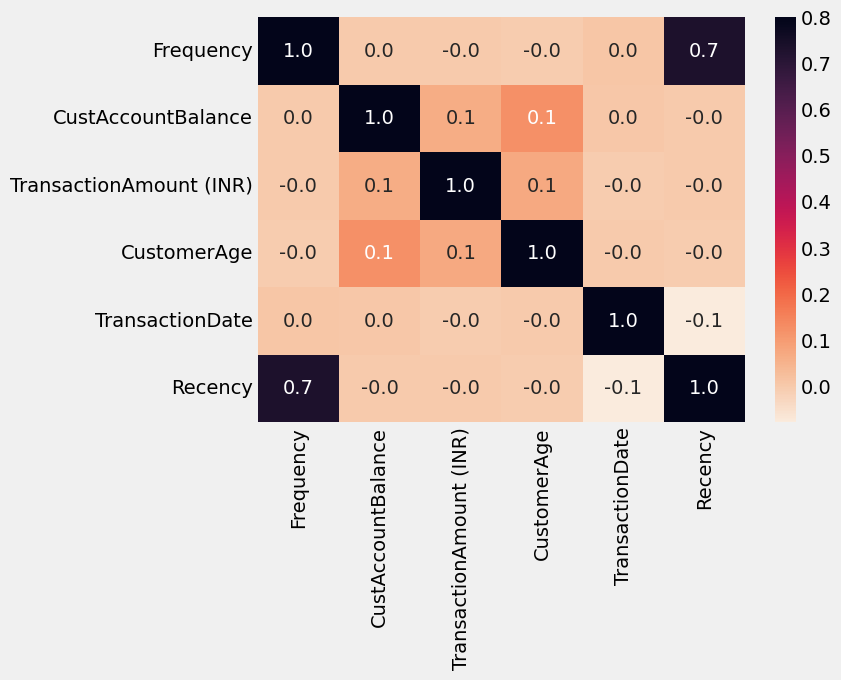

In [39]:
# посмотрим на корреляцию признаков
plt.figure(figsize=(7,5))
correlation=RFM_df.select_dtypes(exclude="object").corr()
sns.heatmap(correlation,vmin=None,
    vmax=0.8,
    cmap='rocket_r',
    annot=True,
    fmt='.1f',
    linecolor='white',
    cbar=True);

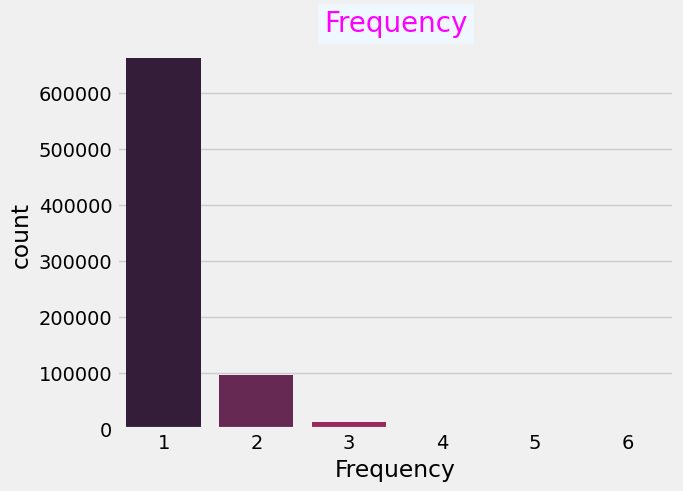

In [40]:
# посмотрим на распределение частотности заказа
chart=sns.countplot(x='Frequency',data=RFM_df,palette='rocket', order = RFM_df['Frequency'].value_counts().index)
plt.title("Frequency",
          fontsize='20',
          backgroundcolor='AliceBlue',
          color='magenta');

In [41]:
RFM_df.Frequency.value_counts()

Frequency
1    661948
2     96174
3     10970
4       974
5        64
6         3
Name: count, dtype: int64

In [42]:
RFM_df.drop(columns=['CustLocation','TransactionDate'],inplace=True)

In [43]:
RFM_df['CustGender']=RFM_df['CustGender'].map({'M':1,'F':0})

In [44]:
RFM_df = RFM_df.rename(columns={"TransactionAmount (INR)" : "TransactionAmount"})

In [45]:
RFM_df.head()

,Frequency,CustGender,CustAccountBalance,TransactionAmount,CustomerAge,Recency
0,2,0,76340.635,2553.0,28.5,18
1,1,1,24204.490,1499.0,22.0,1
2,2,0,100112.950,727.5,28.0,182
3,1,0,496.180,30.0,26.0,1
4,1,0,296828.370,557.0,28.0,1


<Axes: xlabel='CustAccountBalance'>

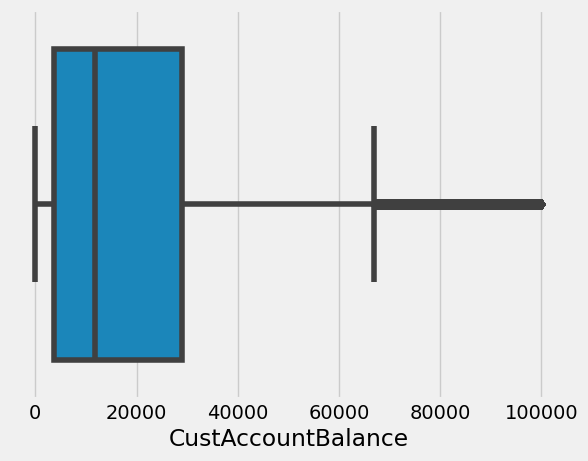

In [46]:
# ящик с усами для отфильтрованного баланса аккаунтов, где прослеживается наибольшее количество записей
sns.boxplot(data=RFM_df.query("CustAccountBalance < 100000"), x="CustAccountBalance")

<Axes: xlabel='TransactionAmount'>

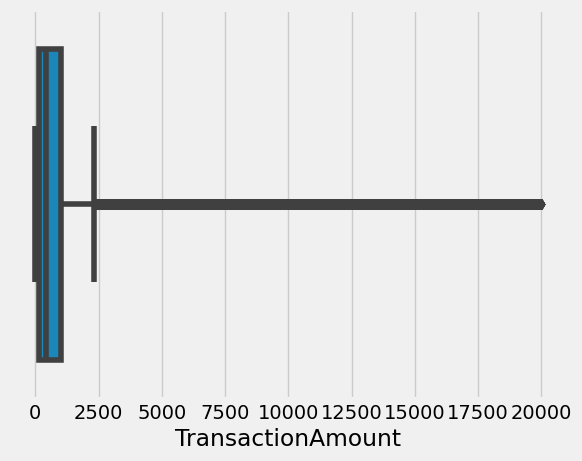

In [47]:
# ящик с усами для отфильтрованной суммы транзакции, где прослеживается наибольшее количество записей
sns.boxplot(data=RFM_df.query("TransactionAmount < 20000"), x="TransactionAmount")

In [48]:
# гистограмма распределения возраста покупателей
import plotly.express as px
import plotly.offline as pyo
pyo.init_notebook_mode()
fig = px.histogram(RFM_df, x="CustomerAge", color="CustGender")
fig.show()

<Axes: xlabel='CustGender', ylabel='count'>

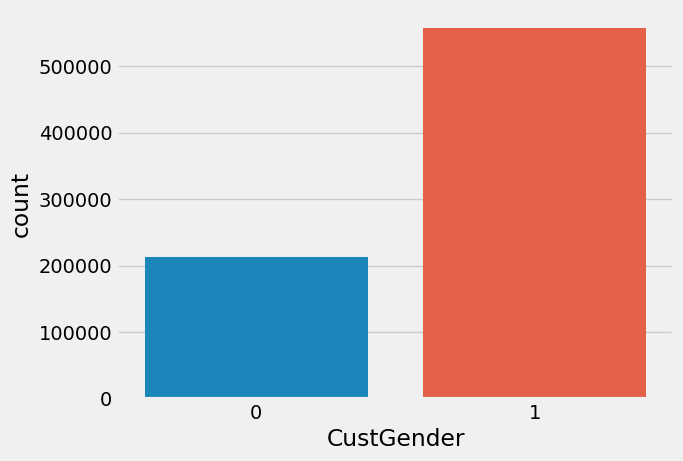

In [49]:
# оценка соотношения полов клиентов
sns.countplot(RFM_df, x="CustGender")

In [50]:
RFM_df.shape

(770133, 6)

# 2.2 Применение метода главных компонент для снижения размерности табличных данных

In [51]:
# 1 нормируем данные
df_scaled=StandardScaler().fit_transform(RFM_df)
df_scaled=pd.DataFrame(df_scaled,columns=RFM_df.columns)
df_scaled.head()

,Frequency,CustGender,CustAccountBalance,TransactionAmount,CustomerAge,Recency
0,2.044196,-1.614870,-0.008248,0.235224,-0.071071,0.094008
1,-0.382191,0.619245,-0.152913,0.039610,-1.333557,-0.295454
2,2.044196,-1.614870,0.057715,-0.103574,-0.168185,3.851176
3,-0.382191,-1.614870,-0.218698,-0.233024,-0.556643,-0.295454
4,-0.382191,-1.614870,0.603555,-0.135217,-0.168185,-0.295454


**1) Ручная реализация метода**

In [52]:
# 2 Построение ковариционной матрицы
cov_matrix = np.cov(df_scaled, rowvar=False)

In [53]:
cov_matrix

array([[ 1.00000130e+00, -1.62958746e-03,  3.32274075e-04,
        -6.11259515e-04, -4.26767200e-03,  7.33240545e-01],
       [-1.62958746e-03,  1.00000130e+00,  5.42840988e-03,
        -1.69380494e-02,  6.65187905e-02, -6.23512652e-04],
       [ 3.32274075e-04,  5.42840988e-03,  1.00000130e+00,
         6.42332787e-02,  1.23790325e-01, -1.13170280e-03],
       [-6.11259515e-04, -1.69380494e-02,  6.42332787e-02,
         1.00000130e+00,  7.05533443e-02, -6.21731674e-04],
       [-4.26767200e-03,  6.65187905e-02,  1.23790325e-01,
         7.05533443e-02,  1.00000130e+00, -3.32013807e-03],
       [ 7.33240545e-01, -6.23512652e-04, -1.13170280e-03,
        -6.21731674e-04, -3.32013807e-03,  1.00000130e+00]])

In [54]:
# 3 Вычисление собственных векторов и собственных значений
eigenvalues, eigenvectors = np.linalg.eig(cov_matrix)

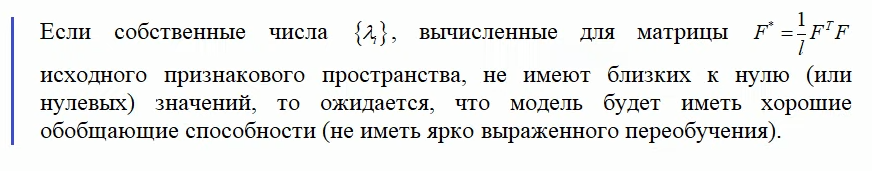

In [55]:
eigenvalues

array([1.73329351, 0.26675772, 1.18348454, 1.02298298, 0.85927339,
       0.93421565])

In [56]:
eigenvectors

array([[-7.07079083e-01,  7.07108269e-01, -5.82065495e-03,
        -9.97329891e-04,  1.38890513e-03, -5.12360324e-04],
       [ 2.88314802e-03,  8.83308777e-04, -2.10600645e-01,
        -8.46435032e-01, -3.44104607e-01,  3.47531340e-01],
       [ 2.35840029e-03, -1.60813335e-03, -5.92936961e-01,
         1.48635585e-01, -5.63714278e-01, -5.55473930e-01],
       [ 2.11591519e-03,  4.52664908e-05, -4.35586498e-01,
         4.77432890e-01, -1.52677191e-01,  7.47667998e-01],
       [ 8.17979659e-03,  1.10079481e-03, -6.43638418e-01,
        -1.83043802e-01,  7.35183367e-01, -1.07990044e-01],
       [-7.07074190e-01, -7.07102055e-01, -5.76517664e-03,
        -2.64713062e-03,  3.37583276e-03,  1.06480929e-03]])

In [57]:
# 4 Сортировка главных компонент
sorted(eigenvalues)[::-1]

[1.7332935050651614,
 1.183484537492735,
 1.0229829838086228,
 0.934215652212084,
 0.8592733893901925,
 0.2667577229034052]

In [58]:
# 5 Проекция данных на главные компоненты, где k - выбранное число компонент
k = 2
projected_data = df_scaled.dot(eigenvectors[:, :k])

**2) Использование возможностей библиотеки**

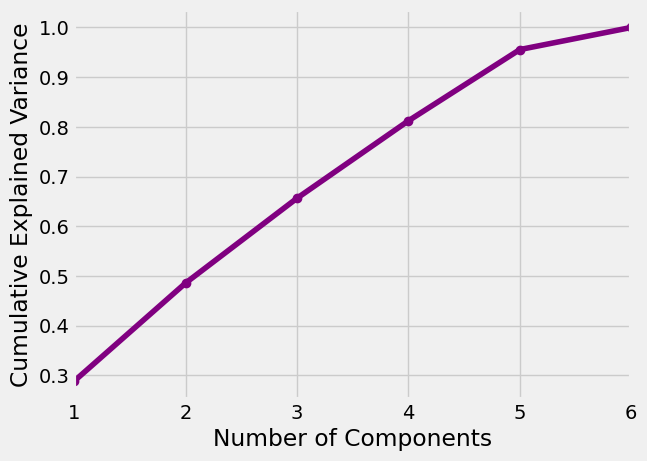

In [59]:
# Визуализация для определения числа компонент
plt.style.use("fivethirtyeight")
pca = PCA().fit(df_scaled)
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), np.cumsum(pca.explained_variance_ratio_), color='purple', marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.xticks(np.arange(0, 7, 1))
plt.xlim(1, len(pca.explained_variance_ratio_))
plt.show()

In [60]:
np.cumsum(pca.explained_variance_ratio_)

array([0.28888188, 0.48612904, 0.65662599, 0.81232839, 0.95554044,
       1.        ])

In [61]:
pca.explained_variance_

array([1.73329351, 1.18348454, 1.02298298, 0.93421565, 0.85927339,
       0.26675772])

In [62]:
pca.components_

array([[ 7.07079083e-01, -2.88314802e-03, -2.35840029e-03,
        -2.11591519e-03, -8.17979659e-03,  7.07074190e-01],
       [ 5.82065495e-03,  2.10600645e-01,  5.92936961e-01,
         4.35586498e-01,  6.43638418e-01,  5.76517664e-03],
       [-9.97329891e-04, -8.46435032e-01,  1.48635585e-01,
         4.77432890e-01, -1.83043802e-01, -2.64713062e-03],
       [-5.12360324e-04,  3.47531340e-01, -5.55473930e-01,
         7.47667998e-01, -1.07990044e-01,  1.06480929e-03],
       [-1.38890513e-03,  3.44104607e-01,  5.63714278e-01,
         1.52677191e-01, -7.35183367e-01, -3.37583276e-03],
       [ 7.07108269e-01,  8.83308777e-04, -1.60813335e-03,
         4.52664908e-05,  1.10079481e-03, -7.07102055e-01]])

In [63]:
pca.explained_variance_ratio_

array([0.28888188, 0.19724717, 0.17049694, 0.15570241, 0.14321205,
       0.04445956])

In [64]:
fig = px.bar(x=["PCA1", "PCA2", "PCA3", "PCA4", "PCA5", "PCA6"], y=pca.explained_variance_ratio_, height=400, 
             color=pca.explained_variance_ratio_,
             labels={'y':'Процент объясненной дисперсии', "x" : "Главные компоненты"}
            )
fig.show()

In [65]:
# Вычисляем матрицу точности данных с помощью порождающей модели.
pca.get_precision()

array([[ 2.16284556e+00,  2.27947318e-03, -3.06007900e-03,
         2.76847467e-04,  4.17264382e-03, -1.58587201e+00],
       [ 2.27947318e-03,  1.00492296e+00,  1.63453920e-03,
         2.17554250e-02, -6.85778750e-02, -1.25713051e-03],
       [-3.06007900e-03,  1.63453920e-03,  1.01877143e+00,
        -5.67883248e-02, -1.22219252e-01,  2.95664390e-03],
       [ 2.76847467e-04,  2.17554250e-02, -5.67883248e-02,
         1.00864194e+00, -6.55785778e-02,  1.55675994e-04],
       [ 4.17264382e-03, -6.85778750e-02, -1.22219252e-01,
        -6.55785778e-02,  1.02433494e+00,  1.19534327e-04],
       [-1.58587201e+00, -1.25713051e-03,  2.95664390e-03,
         1.55675994e-04,  1.19534327e-04,  2.16282591e+00]])

In [66]:
# если взять планку объясненного уровня дисперсии более 80% - т.е. 4 главных компоненты
pca = PCA(n_components=4)
pca_data = pca.fit_transform(df_scaled)

In [67]:
pca_data.shape

(770133, 4)

In [68]:
# таблица уменьшенной размерности
pca_df = pd.DataFrame(pca_data, columns=['PC1', 'PC2', 'PC3', 'PC4'])
pca_df.head()

,PC1,PC2,PC3,PC4
0,1.516638,-0.275826,1.488682,-0.374039
1,-0.469748,-0.805257,-0.282705,0.473654
2,4.174590,-0.425136,1.344564,-0.649500
3,-0.468929,-0.933474,1.326176,-0.553968
4,-0.474253,-0.153300,1.423984,-0.979531


# Демонстрация разницы кластеризации до и после применения метода PCA

# Выбор числа кластеров

In [69]:
kmeans_set = {"init":"k-means++", "max_iter":300, "random_state":42}

inertias = []

for k in range(2,11):
    kmeans = KMeans(n_clusters=k, **kmeans_set)    # open dictionary
    kmeans.fit(df_scaled)
    inertias.append(kmeans.inertia_)

In [70]:
inertias

[3521139.5536581324,
 2846591.707183404,
 2446196.256214273,
 2075181.0456144605,
 1801000.1405544921,
 1547023.1427447787,
 1346084.8598329911,
 1224591.0056263227,
 1099033.9631564089]

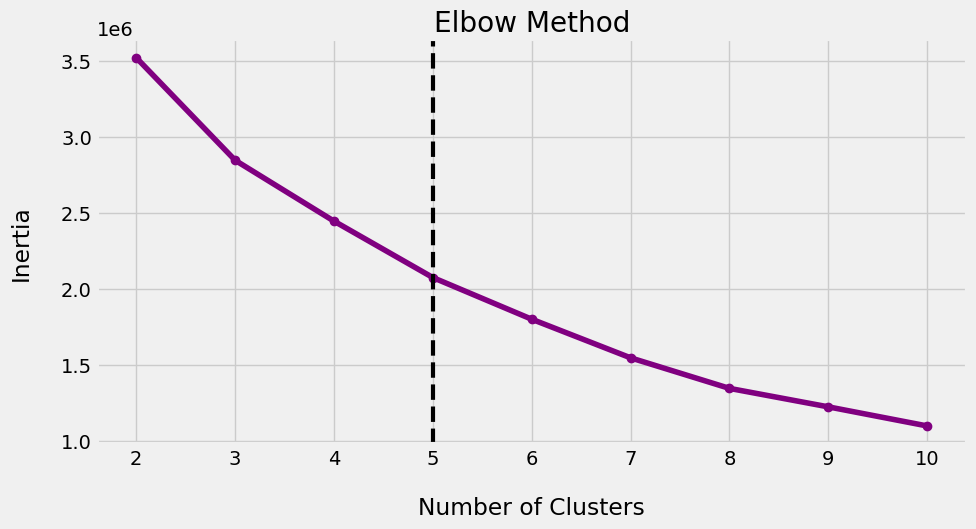

In [71]:
fig, ax = plt.subplots(figsize=(10, 5))
ax.plot(range(2, 11), inertias, color='purple', marker='o', label='Elbow Method')
ax.set_xticks(range(2, 11))
ax.set_xlabel("Number of Clusters", labelpad=20)
ax.set_ylabel("Inertia", labelpad=20)
ax.set_title("Elbow Method")

# Определение локтя и построение вертикальной линии
kl = KneeLocator(range(2, 11), inertias, curve='convex', direction="decreasing")
ax.axvline(x=kl.elbow, color='black', label='axvline-fullheight', ls='--', linewidth=3)

plt.show()

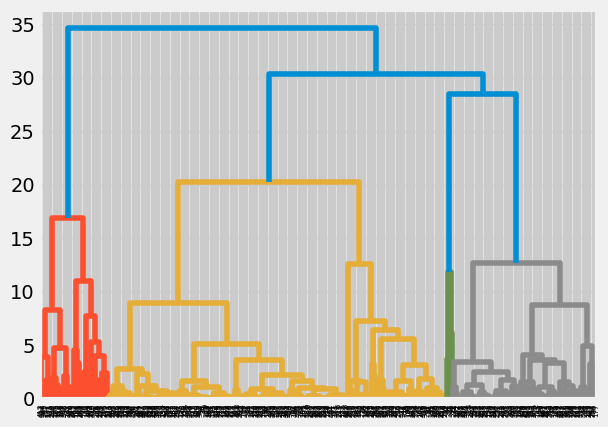

In [72]:
import scipy.cluster.hierarchy as sch
z = sch.linkage(df_scaled.sample(n=500, random_state=1), 'ward')
sch.dendrogram(z);

# До PCA

In [73]:
kmeans = KMeans(n_clusters=5 , **kmeans_set)    
kmeans.fit(df_scaled)
df_scaled['Label']=kmeans.labels_
df_scaled.head()

,Frequency,CustGender,CustAccountBalance,TransactionAmount,CustomerAge,Recency,Label
0,2.044196,-1.614870,-0.008248,0.235224,-0.071071,0.094008,2
1,-0.382191,0.619245,-0.152913,0.039610,-1.333557,-0.295454,0
2,2.044196,-1.614870,0.057715,-0.103574,-0.168185,3.851176,3
3,-0.382191,-1.614870,-0.218698,-0.233024,-0.556643,-0.295454,2
4,-0.382191,-1.614870,0.603555,-0.135217,-0.168185,-0.295454,2


In [74]:
df_scaled.tail()

,Frequency,CustGender,CustAccountBalance,TransactionAmount,CustomerAge,Recency,Label
770128,-0.382191,0.619245,0.149155,-0.110348,-0.556643,-0.295454,0
770129,-0.382191,0.619245,0.046479,-0.197390,-1.722014,-0.295454,0
770130,-0.382191,0.619245,-0.204648,-0.215207,-1.139328,-0.295454,0
770131,-0.382191,0.619245,-0.122137,-0.229312,-1.527786,-0.295454,0
770132,-0.382191,0.619245,-0.200738,-0.079911,0.997186,-0.295454,1


In [75]:
y_kmeans = kmeans.labels_

In [76]:
# from sklearn.metrics import silhouette_score, davies_bouldin_score

# # Вычисление индекса силуэтки
# silhouette_avg = silhouette_score(df_scaled.iloc[:,:-1], y_kmeans)
# print("Индекс силуэтки: ", silhouette_avg)

# # Вычисление индекса Дэвиса-Баудина
# davies_bouldin_avg = davies_bouldin_score(df_scaled.iloc[:,:-1], y_kmeans)
# print("Индекс Дэвиса-Баудина: ", davies_bouldin_avg)

In [77]:
from sklearn.metrics import silhouette_score, davies_bouldin_score

In [78]:
# Вычисление индекса Дэвиса-Баудина
davies_bouldin_avg = davies_bouldin_score(df_scaled.iloc[:,:-1], y_kmeans)
print("Индекс Дэвиса-Баудина: ", davies_bouldin_avg)

Индекс Дэвиса-Баудина:  0.8303031736524717


In [79]:
# Вычисление индекса силуэтки
silhouette_avg = silhouette_score(df_scaled.iloc[:,:-1].head(20000), y_kmeans[:20000])
print("Индекс силуэтки: ", silhouette_avg)

Индекс силуэтки:  0.4311992707707046


# После PCA

In [80]:
kmeans = KMeans(n_clusters=5 , **kmeans_set)    
pca_df.shape[0] == df_scaled.iloc[:,:-1].shape[0]

True

In [81]:
kmeans.fit(pca_df)
pca_df.head()

,PC1,PC2,PC3,PC4
0,1.516638,-0.275826,1.488682,-0.374039
1,-0.469748,-0.805257,-0.282705,0.473654
2,4.174590,-0.425136,1.344564,-0.649500
3,-0.468929,-0.933474,1.326176,-0.553968
4,-0.474253,-0.153300,1.423984,-0.979531


In [82]:
pca_df['Label']=kmeans.labels_

In [83]:
pca_df

,PC1,PC2,PC3,PC4,Label
0,1.516638,-0.275826,1.488682,-0.374039,2
1,-0.469748,-0.805257,-0.282705,0.473654,0
2,4.174590,-0.425136,1.344564,-0.649500,1
3,-0.468929,-0.933474,1.326176,-0.553968,2
4,-0.474253,-0.153300,1.423984,-0.979531,2
...,...,...,...,...,...
770128,-0.476498,-0.191417,-0.451611,0.109845,0
770129,-0.466539,-1.040291,-0.295115,0.227649,0
770130,-0.470675,-0.821915,-0.447605,0.290898,0
770131,-0.467662,-1.029161,-0.370971,0.276469,0


In [84]:
y_kmeans_PCA = kmeans.labels_

In [85]:
davies_bouldin_avg_PCA = davies_bouldin_score(pca_df.iloc[:,:-1], y_kmeans_PCA)
print("Индекс Дэвиса-Баудина: ", davies_bouldin_avg_PCA)

Индекс Дэвиса-Баудина:  0.6905019226799143


In [86]:
# Вычисление индекса силуэтки
silhouette_avg_PCA = silhouette_score(pca_df.iloc[:,:-1].head(20000), y_kmeans_PCA[:20000])
print("Индекс силуэтки: ", silhouette_avg_PCA)

Индекс силуэтки:  0.5325796445605188


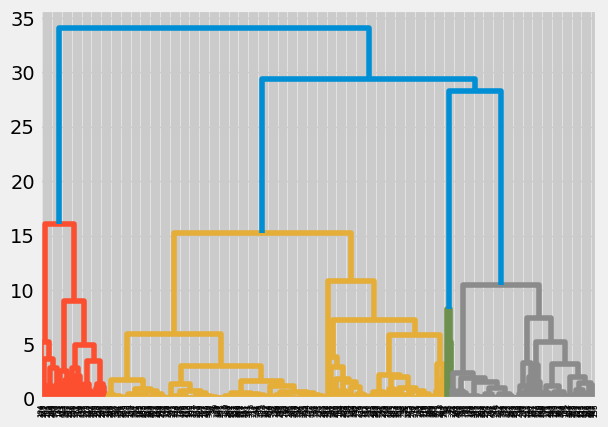

In [87]:
z = sch.linkage(pca_df.iloc[:,:-1].sample(n=500, random_state=1), 'ward')
sch.dendrogram(z);

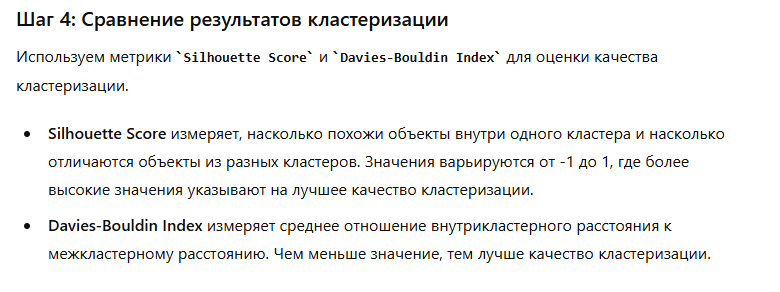

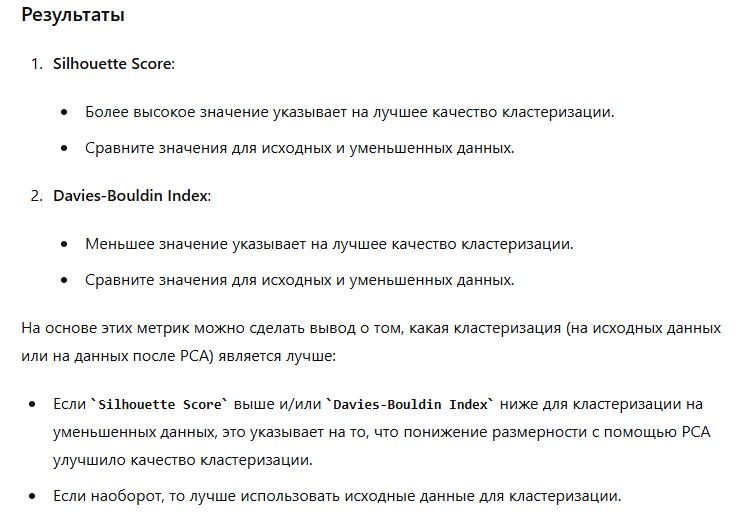

In [88]:
import pandas as pd

# Создаем словарь с данными для таблицы 
data = {'Индекс силуэтки': [0.43119, 0.53257],
        'Индекс Дэвиса-Баундина': [0.83030, 0.69050]}

# Создаем таблицу с помощью библиотеки pandas
table = pd.DataFrame(data, index=['До PCA', 'После PCA'])

# Выводим таблицу на экран
print(table)

           Индекс силуэтки  Индекс Дэвиса-Баундина
До PCA             0.43119                  0.8303
После PCA          0.53257                  0.6905


# Вывод по методу PCA для снижения размерности и улучшения кластеризации
После применения метода главных компонент (PCA) для снижения размерности данных и последующей кластеризации методом k-means для того же количества кластеров, мы получили улучшение качества кластеризации по сравнению с исходными данными.

Индекс силуэтки, который измеряет степень соответствия каждого элемента данных своему кластеру, увеличился с 0.431 до 0.533. Это означает, что элементы данных теперь лучше соответствуют своим кластерам и кластеры более четко разделены.

Индекс Дэвиса-Баудина, который измеряет степень пересечения кластеров, уменьшился с 0.830 до 0.691. Это означает, что кластеры теперь меньше пересекаются и более четко разделены.

Таким образом, мы можем сделать вывод, что применение метода PCA для снижения размерности данных перед кластеризацией методом k-means может улучшить качество кластеризации и помочь получить более четкие и разделенные кластеры.